In [2]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from help_printing import *
import tensorflow as tf

In [3]:
data_path = 'data/celeba_split/'
data_list = os.listdir(data_path)
print(data_list)

['celeba_140000.npy', 'celeba_60000.npy', 'celeba_40000.npy', 'celeba_160000.npy', 'celeba_200000.npy', 'celeba_80000.npy', 'celeba_120000.npy', 'celeba_100000.npy', 'celeba_180000.npy', 'celeba_20000.npy']


In [4]:
dataset = [np.load(data_path+data) for data in data_list[:4]]
#x_data = np.load(data_path+data_list[0])
x_data = np.concatenate(dataset)
x_data.shape

(80000, 64, 64, 3)

In [5]:
from sklearn.model_selection import train_test_split

x_train, x_test = train_test_split(x_data, train_size = 0.9)
train_ds = tf.data.Dataset.from_tensor_slices((x_train, x_train)).shuffle(10000).batch(32)
test_ds = tf.data.Dataset.from_tensor_slices((x_test, x_test)).batch(32)

In [6]:
from Models import  *

encoder, decoder, generator = build_vae()
#encoder.summary()
#decoder.summary()
generator.summary()

Model: "vae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 64, 64, 3)]       0         
_________________________________________________________________
encoder (Model)              [(None, 10), (None, 10),  230900    
_________________________________________________________________
decoder (Model)              (None, 64, 64, 3)         228803    
Total params: 459,703
Trainable params: 459,703
Non-trainable params: 0
_________________________________________________________________


In [39]:
def build_discriminator():
    
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(32, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[64, 64, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2D(32, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[28, 28, 1]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

In [40]:
from Models import build_vae

encoder, decoder, generator = build_vae()
discriminator = build_discriminator()
discriminator.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_57 (Conv2D)           (None, 32, 32, 32)        2432      
_________________________________________________________________
leaky_re_lu_87 (LeakyReLU)   (None, 32, 32, 32)        0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_58 (Conv2D)           (None, 16, 16, 32)        25632     
_________________________________________________________________
leaky_re_lu_88 (LeakyReLU)   (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_14 (Dropout)         (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_59 (Conv2D)           (None, 8, 8, 64)         

In [41]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [42]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [55]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
reconstructor_optimizer = tf.keras.optimizers.Adam(1e-4)
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [70]:
# @tf.function
def train_step(image):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape, tf.GradientTape() as rec_tape:
        
        generated_image = generator(image, training=True)
        real_output = discriminator(image, training=True)
        fake_output = discriminator(generated_image, training=True)

        rec_loss = tf.keras.losses.binary_crossentropy(image, generated_image)
        rec_loss = K.mean(rec_loss)
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_reconstructor = rec_tape.gradient(rec_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    
    
    reconstructor_optimizer.apply_gradients(zip(gradients_of_reconstructor, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    
    return rec_loss, gen_loss, disc_loss

In [71]:
def train(dataset, epochs):
    batch=0
    for epoch in range(epochs):
        
        for image_batch in dataset:
            rec_loss, gen_loss, disc_loss = train_step(image_batch)            
            if batch %100 ==0: print('* Batch %i : rec_loss = %f, gen_loss = %f, disc_loss = %f'%(batch, rec_loss, gen_loss, disc_loss))
            batch = batch+1
        print('* Epoch %i : rec_loss = %f, gen_loss = %f, disc_loss = %f'%(batch, rec_loss, gen_loss, disc_loss))
        plot_recimg(generator)

* Batch 0 : rec_loss = 0.666180, gen_loss = 7.678586, disc_loss = 0.002320
* Batch 100 : rec_loss = 0.659520, gen_loss = 9.900901, disc_loss = 0.000206
* Batch 200 : rec_loss = 0.666557, gen_loss = 13.005996, disc_loss = 0.000030
* Batch 300 : rec_loss = 0.670732, gen_loss = 7.616207, disc_loss = 0.001447
* Batch 400 : rec_loss = 0.669196, gen_loss = 10.605663, disc_loss = 0.000227
* Batch 500 : rec_loss = 0.650560, gen_loss = 6.729761, disc_loss = 0.005617
* Batch 600 : rec_loss = 0.667228, gen_loss = 13.615042, disc_loss = 0.265760
* Batch 700 : rec_loss = 0.671436, gen_loss = 11.313702, disc_loss = 0.000077
* Batch 800 : rec_loss = 0.668579, gen_loss = 10.541085, disc_loss = 0.000129
* Batch 900 : rec_loss = 0.675635, gen_loss = 11.075100, disc_loss = 0.000121
* Batch 1000 : rec_loss = 0.666526, gen_loss = 9.295694, disc_loss = 0.001804
* Batch 1100 : rec_loss = 0.668124, gen_loss = 9.991064, disc_loss = 0.000544
* Batch 1200 : rec_loss = 0.648299, gen_loss = 7.271680, disc_loss = 0

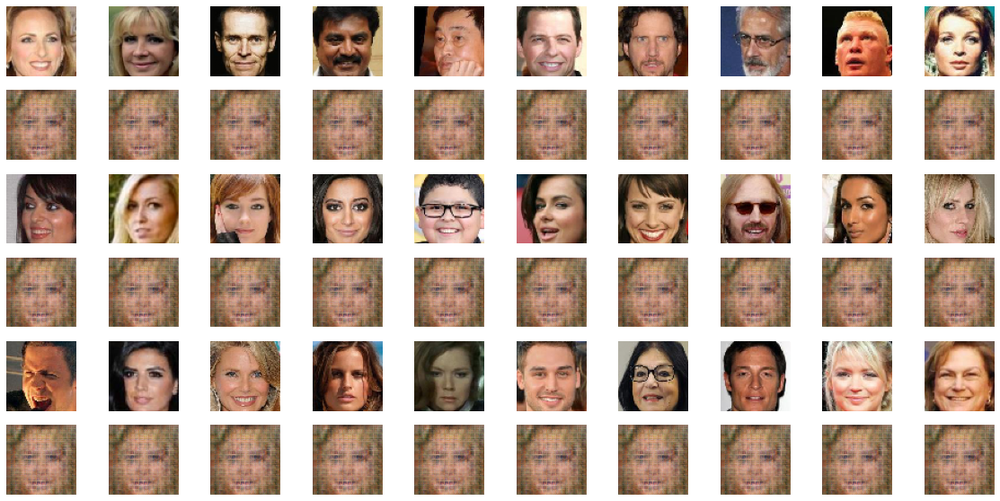

* Batch 2300 : rec_loss = 0.659588, gen_loss = 11.857897, disc_loss = 0.000046
* Batch 2400 : rec_loss = 0.659159, gen_loss = 9.190517, disc_loss = 0.000433
* Batch 2500 : rec_loss = 0.674528, gen_loss = 9.813052, disc_loss = 0.000345
* Batch 2600 : rec_loss = 0.674648, gen_loss = 10.516214, disc_loss = 0.000973
* Batch 2700 : rec_loss = 0.659964, gen_loss = 8.807191, disc_loss = 0.000341
* Batch 2800 : rec_loss = 0.683868, gen_loss = 6.947618, disc_loss = 0.009703
* Batch 2900 : rec_loss = 0.670528, gen_loss = 14.963771, disc_loss = 0.000002
* Batch 3000 : rec_loss = 0.663588, gen_loss = 10.527216, disc_loss = 0.000575
* Batch 3100 : rec_loss = 0.676232, gen_loss = 9.784857, disc_loss = 0.000294
* Batch 3200 : rec_loss = 0.667938, gen_loss = 8.757065, disc_loss = 0.003260
* Batch 3300 : rec_loss = 0.662754, gen_loss = 9.393293, disc_loss = 0.000299
* Batch 3400 : rec_loss = 0.674112, gen_loss = 10.863007, disc_loss = 0.436363
* Batch 3500 : rec_loss = 0.672135, gen_loss = 9.725723, di

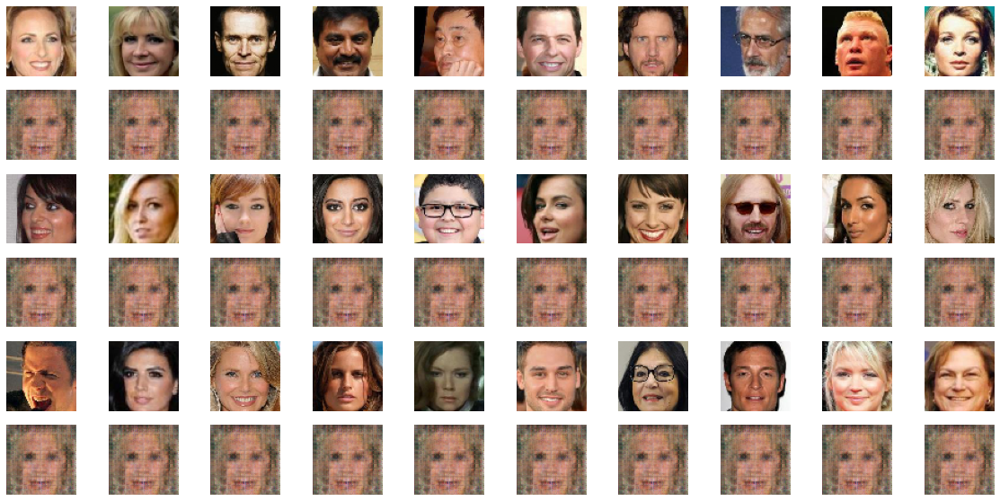

* Batch 4500 : rec_loss = 0.658402, gen_loss = 14.101738, disc_loss = 0.000002
* Batch 4600 : rec_loss = 0.678551, gen_loss = 9.081402, disc_loss = 0.000572
* Batch 4700 : rec_loss = 0.672854, gen_loss = 11.039054, disc_loss = 0.000062
* Batch 4800 : rec_loss = 0.651848, gen_loss = 9.037266, disc_loss = 0.000451
* Batch 4900 : rec_loss = 0.661562, gen_loss = 13.496154, disc_loss = 0.000005
* Batch 5000 : rec_loss = 0.660337, gen_loss = 15.502279, disc_loss = 0.000001
* Batch 5100 : rec_loss = 0.681479, gen_loss = 7.474773, disc_loss = 0.099537
* Batch 5200 : rec_loss = 0.664909, gen_loss = 14.556677, disc_loss = 0.004350
* Batch 5300 : rec_loss = 0.672859, gen_loss = 7.642705, disc_loss = 0.000998
* Batch 5400 : rec_loss = 0.671269, gen_loss = 11.506052, disc_loss = 0.000046
* Batch 5500 : rec_loss = 0.657784, gen_loss = 10.770435, disc_loss = 0.000298
* Batch 5600 : rec_loss = 0.665268, gen_loss = 11.738426, disc_loss = 0.000024
* Batch 5700 : rec_loss = 0.663301, gen_loss = 10.732866

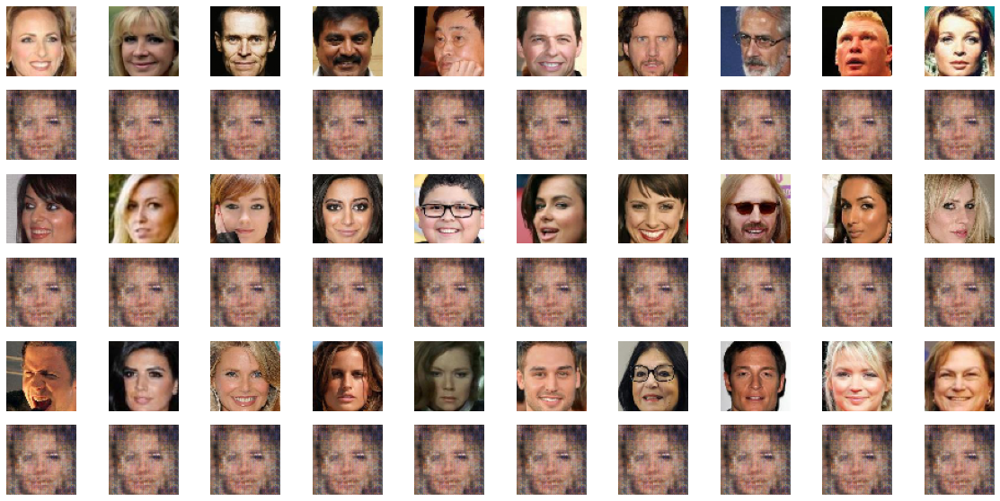

* Batch 6800 : rec_loss = 0.656192, gen_loss = 9.417369, disc_loss = 0.000742
* Batch 6900 : rec_loss = 0.670123, gen_loss = 9.084278, disc_loss = 0.000219
* Batch 7000 : rec_loss = 0.660714, gen_loss = 9.517767, disc_loss = 0.091119
* Batch 7100 : rec_loss = 0.659606, gen_loss = 10.539021, disc_loss = 0.000286
* Batch 7200 : rec_loss = 0.667181, gen_loss = 12.931682, disc_loss = 0.075769
* Batch 7300 : rec_loss = 0.669312, gen_loss = 9.702902, disc_loss = 0.000369
* Batch 7400 : rec_loss = 0.663990, gen_loss = 18.987291, disc_loss = 0.000000
* Batch 7500 : rec_loss = 0.686498, gen_loss = 11.626017, disc_loss = 0.000068
* Batch 7600 : rec_loss = 0.685242, gen_loss = 12.010586, disc_loss = 0.000034
* Batch 7700 : rec_loss = 0.650524, gen_loss = 9.996799, disc_loss = 0.000185
* Batch 7800 : rec_loss = 0.675047, gen_loss = 11.601408, disc_loss = 0.000070
* Batch 7900 : rec_loss = 0.687745, gen_loss = 13.908360, disc_loss = 0.000004
* Batch 8000 : rec_loss = 0.683161, gen_loss = 11.311399,

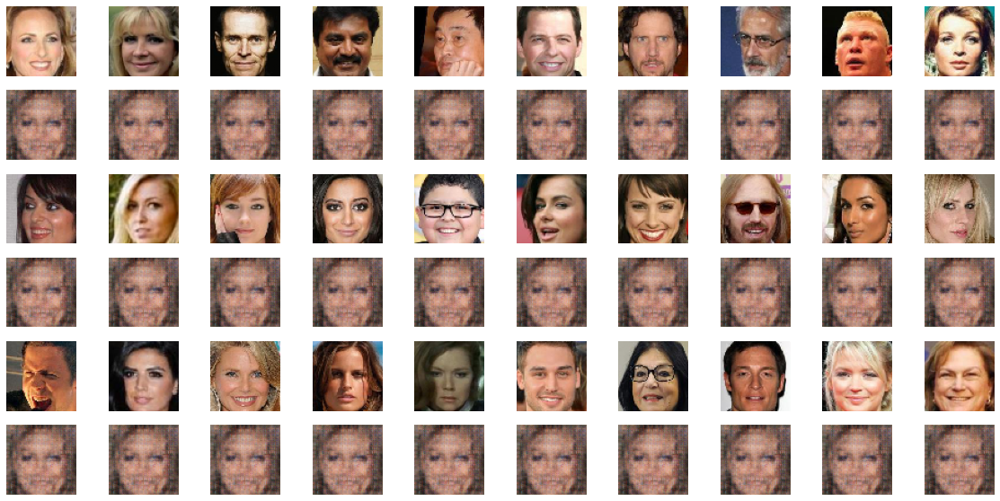

* Batch 9000 : rec_loss = 0.656888, gen_loss = 7.480000, disc_loss = 0.005947
* Batch 9100 : rec_loss = 0.670319, gen_loss = 11.949652, disc_loss = 0.000036
* Batch 9200 : rec_loss = 0.666497, gen_loss = 10.273903, disc_loss = 0.000109
* Batch 9300 : rec_loss = 0.665020, gen_loss = 8.743226, disc_loss = 0.000875
* Batch 9400 : rec_loss = 0.657973, gen_loss = 10.099014, disc_loss = 0.000588
* Batch 9500 : rec_loss = 0.656270, gen_loss = 10.093686, disc_loss = 0.000280
* Batch 9600 : rec_loss = 0.667191, gen_loss = 12.463932, disc_loss = 0.000049
* Batch 9700 : rec_loss = 0.674273, gen_loss = 10.677907, disc_loss = 0.000149
* Batch 9800 : rec_loss = 0.666309, gen_loss = 8.730884, disc_loss = 0.000705
* Batch 9900 : rec_loss = 0.663359, gen_loss = 9.681388, disc_loss = 0.000185
* Batch 10000 : rec_loss = 0.664387, gen_loss = 12.218394, disc_loss = 0.000015
* Batch 10100 : rec_loss = 0.657027, gen_loss = 8.617023, disc_loss = 0.002987
* Batch 10200 : rec_loss = 0.668168, gen_loss = 6.34878

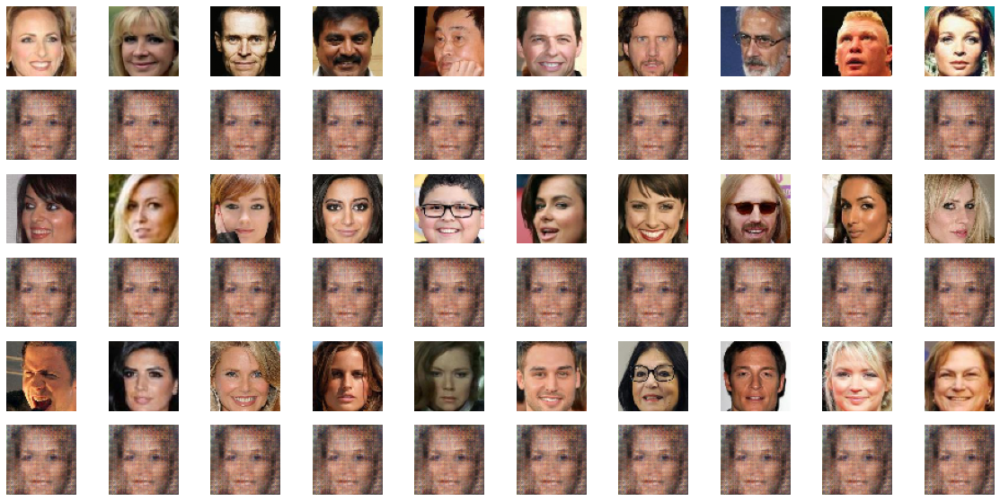

* Batch 11300 : rec_loss = 0.671966, gen_loss = 8.875353, disc_loss = 0.001570
* Batch 11400 : rec_loss = 0.661893, gen_loss = 12.725668, disc_loss = 0.000017
* Batch 11500 : rec_loss = 0.676866, gen_loss = 7.612347, disc_loss = 0.002607
* Batch 11600 : rec_loss = 0.657444, gen_loss = 8.162738, disc_loss = 0.003047
* Batch 11700 : rec_loss = 0.666381, gen_loss = 7.323078, disc_loss = 0.026900
* Batch 11800 : rec_loss = 0.668151, gen_loss = 9.329432, disc_loss = 0.000272
* Batch 11900 : rec_loss = 0.665733, gen_loss = 7.683566, disc_loss = 0.005466
* Batch 12000 : rec_loss = 0.673644, gen_loss = 10.796024, disc_loss = 0.000081
* Batch 12100 : rec_loss = 0.669346, gen_loss = 7.110383, disc_loss = 0.006294
* Batch 12200 : rec_loss = 0.664073, gen_loss = 10.568351, disc_loss = 0.000256
* Batch 12300 : rec_loss = 0.667744, gen_loss = 11.429127, disc_loss = 0.000079
* Batch 12400 : rec_loss = 0.672177, gen_loss = 9.204725, disc_loss = 0.000469
* Batch 12500 : rec_loss = 0.671289, gen_loss = 

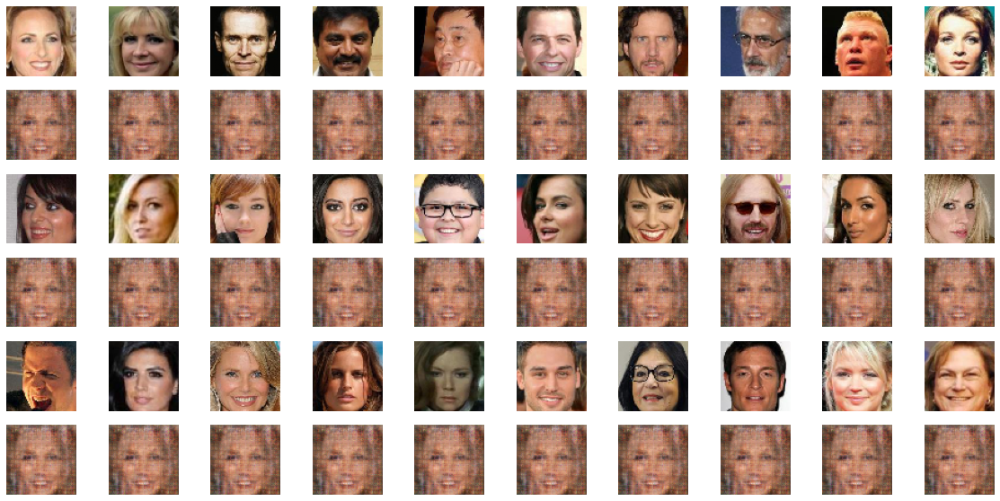

* Batch 13500 : rec_loss = 0.668622, gen_loss = 10.348572, disc_loss = 0.000139
* Batch 13600 : rec_loss = 0.669693, gen_loss = 10.487870, disc_loss = 0.000112
* Batch 13700 : rec_loss = 0.665721, gen_loss = 9.042623, disc_loss = 0.000280
* Batch 13800 : rec_loss = 0.675101, gen_loss = 9.020141, disc_loss = 0.000539
* Batch 13900 : rec_loss = 0.667377, gen_loss = 9.196859, disc_loss = 0.000739
* Batch 14000 : rec_loss = 0.689034, gen_loss = 7.270320, disc_loss = 0.002439
* Batch 14100 : rec_loss = 0.652703, gen_loss = 10.645971, disc_loss = 0.000155
* Batch 14200 : rec_loss = 0.680391, gen_loss = 8.724443, disc_loss = 0.000589
* Batch 14300 : rec_loss = 0.681381, gen_loss = 12.610561, disc_loss = 0.000017
* Batch 14400 : rec_loss = 0.662673, gen_loss = 11.619907, disc_loss = 0.000030
* Batch 14500 : rec_loss = 0.665259, gen_loss = 14.528568, disc_loss = 0.000001
* Batch 14600 : rec_loss = 0.671046, gen_loss = 9.363297, disc_loss = 0.000370
* Batch 14700 : rec_loss = 0.674865, gen_loss 

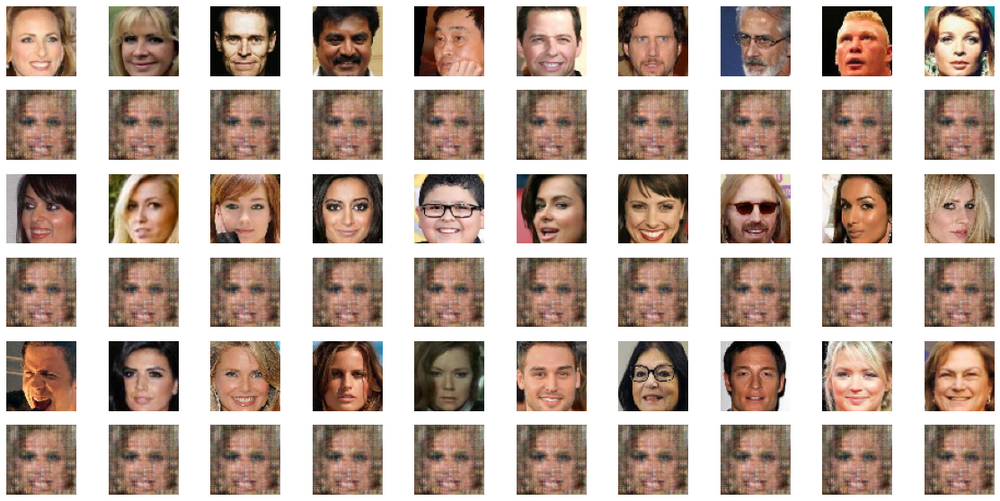

* Batch 15800 : rec_loss = 0.668247, gen_loss = 8.175112, disc_loss = 0.001190
* Batch 15900 : rec_loss = 0.672134, gen_loss = 10.155443, disc_loss = 0.000829
* Batch 16000 : rec_loss = 0.663524, gen_loss = 9.457258, disc_loss = 0.000706
* Batch 16100 : rec_loss = 0.668938, gen_loss = 8.814968, disc_loss = 0.000939
* Batch 16200 : rec_loss = 0.654688, gen_loss = 11.647123, disc_loss = 0.000274
* Batch 16300 : rec_loss = 0.684538, gen_loss = 9.005474, disc_loss = 0.002088
* Batch 16400 : rec_loss = 0.660981, gen_loss = 9.085773, disc_loss = 0.000478
* Batch 16500 : rec_loss = 0.689876, gen_loss = 7.602203, disc_loss = 0.003867
* Batch 16600 : rec_loss = 0.666389, gen_loss = 9.488463, disc_loss = 0.000390
* Batch 16700 : rec_loss = 0.664241, gen_loss = 11.310646, disc_loss = 0.000028
* Batch 16800 : rec_loss = 0.666830, gen_loss = 9.608371, disc_loss = 0.000191
* Batch 16900 : rec_loss = 0.662710, gen_loss = 10.507283, disc_loss = 0.000108
* Batch 17000 : rec_loss = 0.675719, gen_loss = 

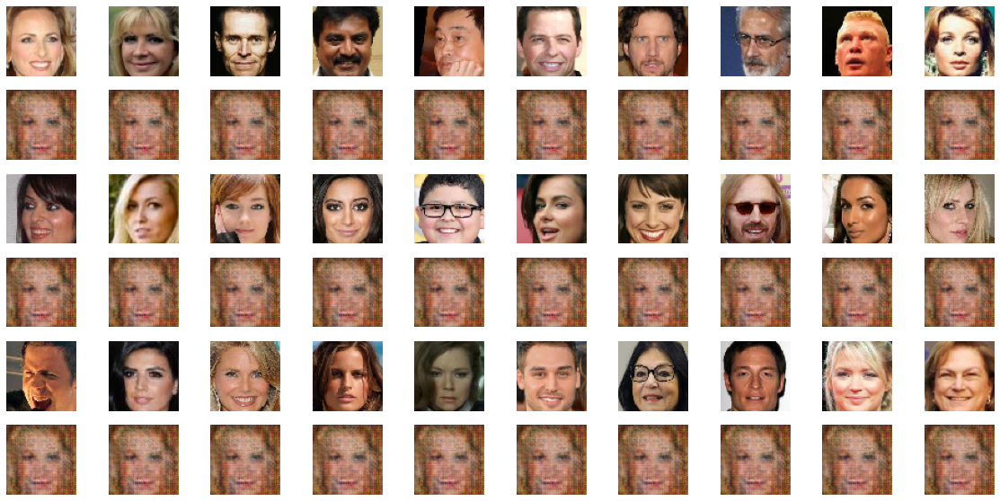

* Batch 18000 : rec_loss = 0.672534, gen_loss = 13.254647, disc_loss = 0.000005
* Batch 18100 : rec_loss = 0.676767, gen_loss = 12.080220, disc_loss = 0.000029
* Batch 18200 : rec_loss = 0.668992, gen_loss = 10.449020, disc_loss = 0.000148
* Batch 18300 : rec_loss = 0.676248, gen_loss = 9.294296, disc_loss = 0.000356
* Batch 18400 : rec_loss = 0.670535, gen_loss = 7.376093, disc_loss = 0.003171
* Batch 18500 : rec_loss = 0.673922, gen_loss = 11.074680, disc_loss = 0.000097
* Batch 18600 : rec_loss = 0.666848, gen_loss = 8.465336, disc_loss = 0.002854
* Batch 18700 : rec_loss = 0.662490, gen_loss = 10.987343, disc_loss = 0.000110
* Batch 18800 : rec_loss = 0.681187, gen_loss = 7.439240, disc_loss = 0.008935
* Batch 18900 : rec_loss = 0.674059, gen_loss = 13.040517, disc_loss = 0.000020
* Batch 19000 : rec_loss = 0.669194, gen_loss = 8.646049, disc_loss = 0.001177
* Batch 19100 : rec_loss = 0.708158, gen_loss = 9.818367, disc_loss = 0.000223
* Batch 19200 : rec_loss = 0.666136, gen_loss 

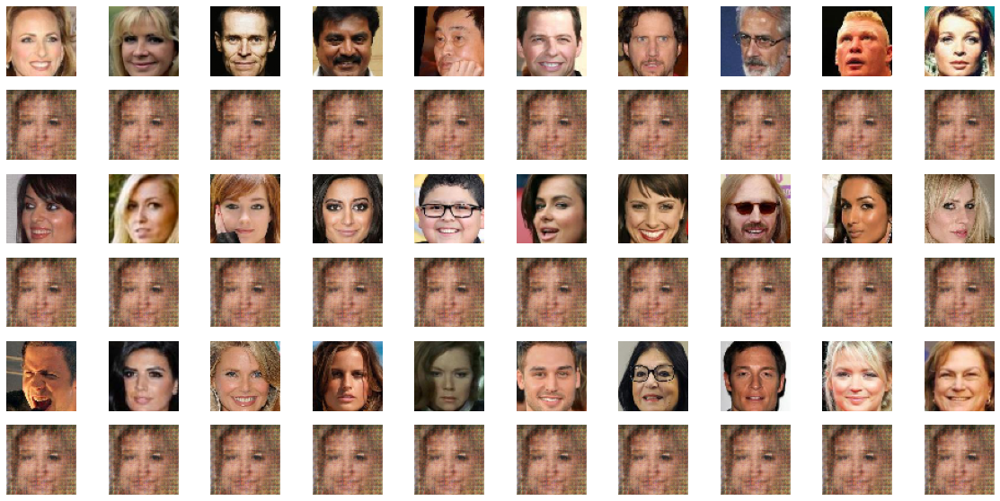

* Batch 20300 : rec_loss = 0.684342, gen_loss = 9.787348, disc_loss = 0.000214
* Batch 20400 : rec_loss = 0.664190, gen_loss = 8.739446, disc_loss = 0.001800
* Batch 20500 : rec_loss = 0.672260, gen_loss = 13.936402, disc_loss = 0.000008
* Batch 20600 : rec_loss = 0.659564, gen_loss = 13.743671, disc_loss = 0.000010
* Batch 20700 : rec_loss = 0.659945, gen_loss = 12.220461, disc_loss = 0.000019
* Batch 20800 : rec_loss = 0.676943, gen_loss = 6.869633, disc_loss = 0.004793
* Batch 20900 : rec_loss = 0.682517, gen_loss = 10.037071, disc_loss = 0.000337
* Batch 21000 : rec_loss = 0.674925, gen_loss = 9.447229, disc_loss = 0.000325
* Batch 21100 : rec_loss = 0.665963, gen_loss = 13.510073, disc_loss = 0.000005
* Batch 21200 : rec_loss = 0.668544, gen_loss = 10.866690, disc_loss = 0.000582
* Batch 21300 : rec_loss = 0.670463, gen_loss = 7.919627, disc_loss = 0.013878
* Batch 21400 : rec_loss = 0.689369, gen_loss = 10.960746, disc_loss = 0.000476
* Batch 21500 : rec_loss = 0.678756, gen_loss

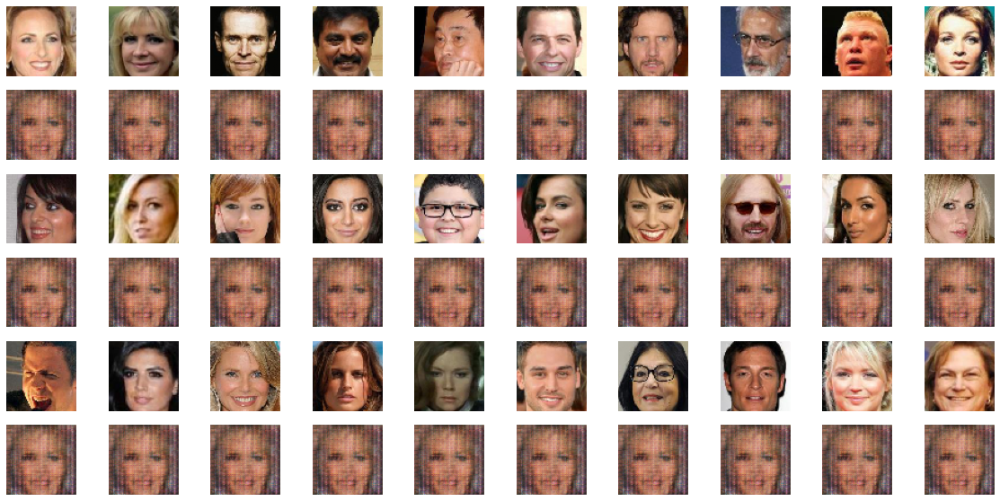

* Batch 22500 : rec_loss = 0.662131, gen_loss = 9.281959, disc_loss = 0.001098
* Batch 22600 : rec_loss = 0.674827, gen_loss = 8.103965, disc_loss = 0.003375
* Batch 22700 : rec_loss = 0.664009, gen_loss = 9.536818, disc_loss = 0.000326
* Batch 22800 : rec_loss = 0.672918, gen_loss = 13.868347, disc_loss = 0.000052
* Batch 22900 : rec_loss = 0.686090, gen_loss = 8.164187, disc_loss = 0.001594
* Batch 23000 : rec_loss = 0.658824, gen_loss = 11.557645, disc_loss = 0.000110
* Batch 23100 : rec_loss = 0.680810, gen_loss = 9.767490, disc_loss = 0.000503
* Batch 23200 : rec_loss = 0.668843, gen_loss = 10.380974, disc_loss = 0.000907
* Batch 23300 : rec_loss = 0.680408, gen_loss = 11.177187, disc_loss = 0.000049
* Batch 23400 : rec_loss = 0.659603, gen_loss = 9.582469, disc_loss = 0.000201
* Batch 23500 : rec_loss = 0.668886, gen_loss = 15.283678, disc_loss = 0.000001
* Batch 23600 : rec_loss = 0.671903, gen_loss = 13.562774, disc_loss = 0.000009
* Batch 23700 : rec_loss = 0.664465, gen_loss 

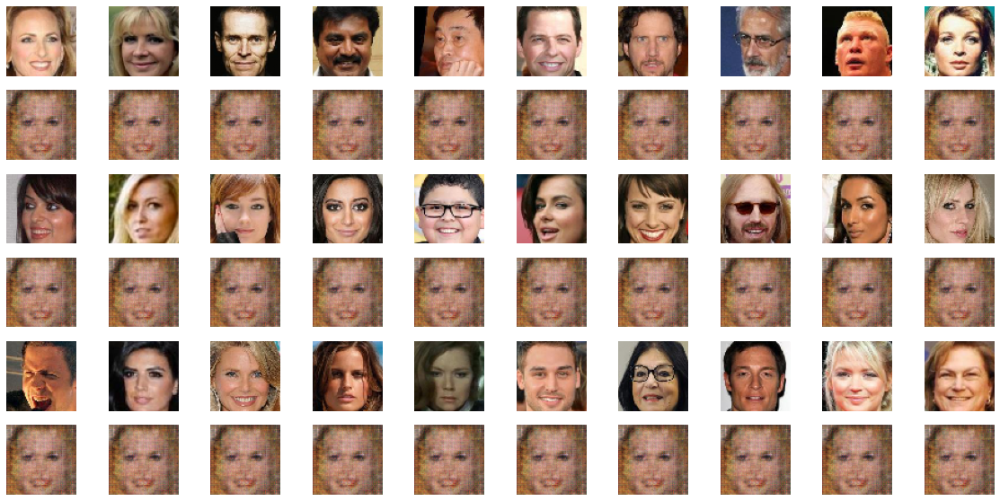

* Batch 24800 : rec_loss = 0.662723, gen_loss = 11.869097, disc_loss = 0.000054
* Batch 24900 : rec_loss = 0.676155, gen_loss = 12.511326, disc_loss = 0.000066
* Batch 25000 : rec_loss = 0.676667, gen_loss = 9.823762, disc_loss = 0.003559
* Batch 25100 : rec_loss = 0.661590, gen_loss = 10.004920, disc_loss = 0.000119
* Batch 25200 : rec_loss = 0.659111, gen_loss = 10.145348, disc_loss = 0.000204
* Batch 25300 : rec_loss = 0.672638, gen_loss = 9.947731, disc_loss = 0.000456
* Batch 25400 : rec_loss = 0.664397, gen_loss = 10.205091, disc_loss = 0.000120
* Batch 25500 : rec_loss = 0.662424, gen_loss = 8.218601, disc_loss = 0.001178
* Batch 25600 : rec_loss = 0.668935, gen_loss = 11.987055, disc_loss = 0.000019
* Batch 25700 : rec_loss = 0.661517, gen_loss = 8.228256, disc_loss = 0.002711
* Batch 25800 : rec_loss = 0.670695, gen_loss = 14.012372, disc_loss = 0.000006
* Batch 25900 : rec_loss = 0.667896, gen_loss = 10.402426, disc_loss = 0.202867
* Batch 26000 : rec_loss = 0.662018, gen_los

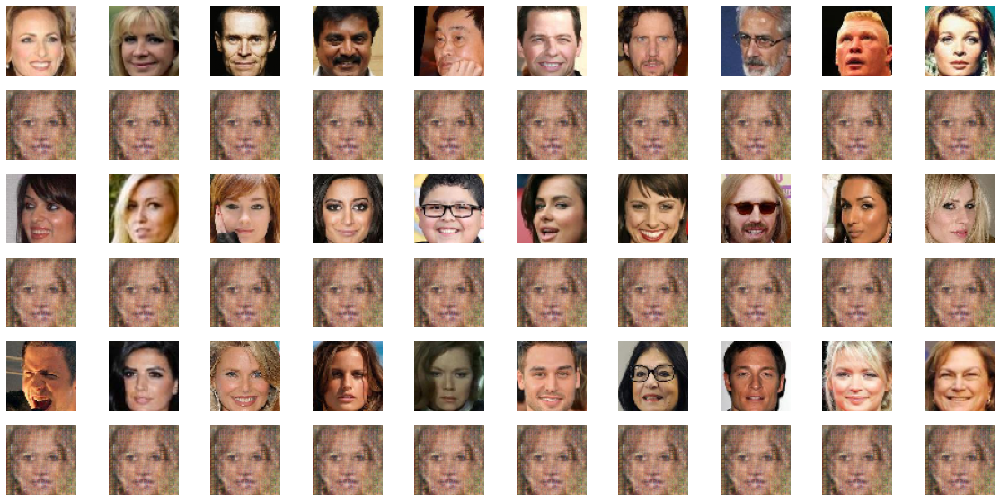

* Batch 27000 : rec_loss = 0.670927, gen_loss = 15.657362, disc_loss = 0.000001
* Batch 27100 : rec_loss = 0.650613, gen_loss = 12.651639, disc_loss = 0.000010
* Batch 27200 : rec_loss = 0.672189, gen_loss = 11.198615, disc_loss = 0.000077
* Batch 27300 : rec_loss = 0.666524, gen_loss = 9.696791, disc_loss = 0.032311
* Batch 27400 : rec_loss = 0.660443, gen_loss = 9.490850, disc_loss = 0.000203
* Batch 27500 : rec_loss = 0.674874, gen_loss = 9.760887, disc_loss = 0.000539
* Batch 27600 : rec_loss = 0.681252, gen_loss = 10.658330, disc_loss = 0.000375
* Batch 27700 : rec_loss = 0.669596, gen_loss = 10.317902, disc_loss = 0.000151
* Batch 27800 : rec_loss = 0.656414, gen_loss = 15.651062, disc_loss = 0.000000
* Batch 27900 : rec_loss = 0.673800, gen_loss = 10.871507, disc_loss = 0.000062
* Batch 28000 : rec_loss = 0.662921, gen_loss = 9.340693, disc_loss = 0.000328
* Batch 28100 : rec_loss = 0.676556, gen_loss = 9.869257, disc_loss = 0.000269
* Batch 28200 : rec_loss = 0.677802, gen_loss

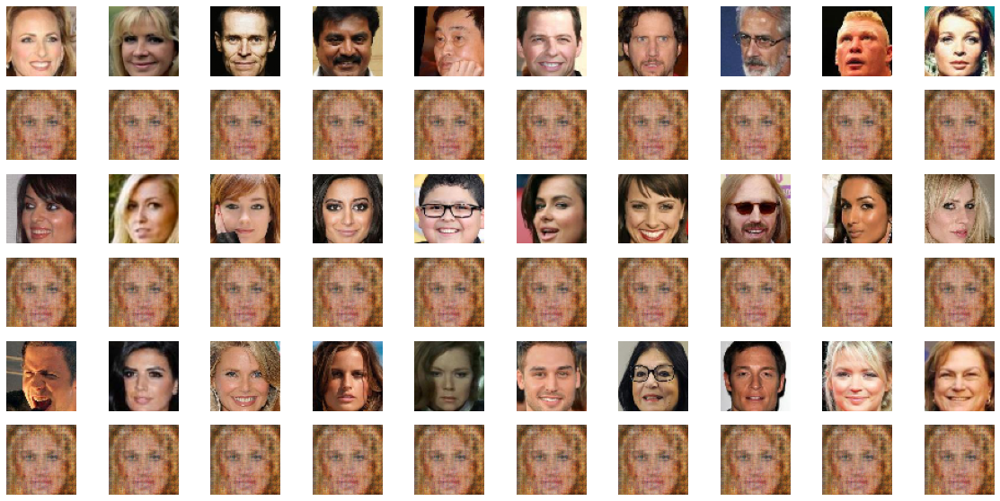

* Batch 29300 : rec_loss = 0.673776, gen_loss = 12.933346, disc_loss = 0.000099
* Batch 29400 : rec_loss = 0.667486, gen_loss = 9.956545, disc_loss = 0.000373
* Batch 29500 : rec_loss = 0.679185, gen_loss = 7.110268, disc_loss = 0.003054
* Batch 29600 : rec_loss = 0.667783, gen_loss = 6.306004, disc_loss = 0.005661
* Batch 29700 : rec_loss = 0.675263, gen_loss = 10.264425, disc_loss = 0.004517
* Batch 29800 : rec_loss = 0.665690, gen_loss = 8.681179, disc_loss = 0.001866
* Batch 29900 : rec_loss = 0.672775, gen_loss = 12.192413, disc_loss = 0.000025
* Batch 30000 : rec_loss = 0.666004, gen_loss = 10.168892, disc_loss = 0.000200
* Batch 30100 : rec_loss = 0.668499, gen_loss = 8.604124, disc_loss = 0.000450
* Batch 30200 : rec_loss = 0.661334, gen_loss = 9.789741, disc_loss = 0.000298
* Batch 30300 : rec_loss = 0.679081, gen_loss = 10.373133, disc_loss = 0.000094
* Batch 30400 : rec_loss = 0.666993, gen_loss = 8.110880, disc_loss = 0.000600
* Batch 30500 : rec_loss = 0.669723, gen_loss =

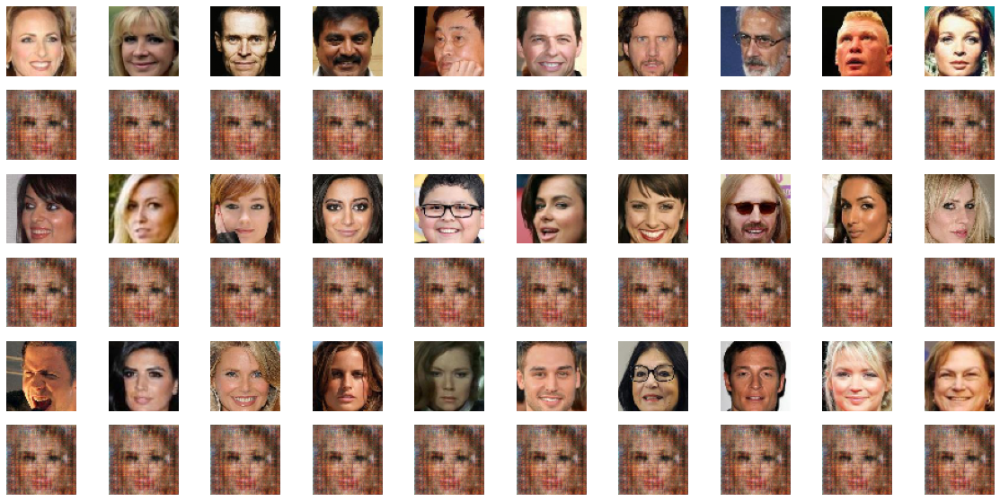

* Batch 31500 : rec_loss = 0.673537, gen_loss = 9.961406, disc_loss = 0.000360
* Batch 31600 : rec_loss = 0.667779, gen_loss = 10.813604, disc_loss = 0.000109
* Batch 31700 : rec_loss = 0.671572, gen_loss = 12.107878, disc_loss = 0.000064
* Batch 31800 : rec_loss = 0.682706, gen_loss = 10.939622, disc_loss = 0.000101
* Batch 31900 : rec_loss = 0.665752, gen_loss = 11.310514, disc_loss = 0.000045
* Batch 32000 : rec_loss = 0.674675, gen_loss = 14.307985, disc_loss = 0.000002
* Batch 32100 : rec_loss = 0.670147, gen_loss = 9.061712, disc_loss = 0.000231
* Batch 32200 : rec_loss = 0.675841, gen_loss = 9.602232, disc_loss = 0.000240
* Batch 32300 : rec_loss = 0.677527, gen_loss = 11.018571, disc_loss = 0.000126
* Batch 32400 : rec_loss = 0.665564, gen_loss = 9.912655, disc_loss = 0.000198
* Batch 32500 : rec_loss = 0.674323, gen_loss = 11.367697, disc_loss = 0.000067
* Batch 32600 : rec_loss = 0.668262, gen_loss = 11.391834, disc_loss = 0.000055
* Batch 32700 : rec_loss = 0.669267, gen_los

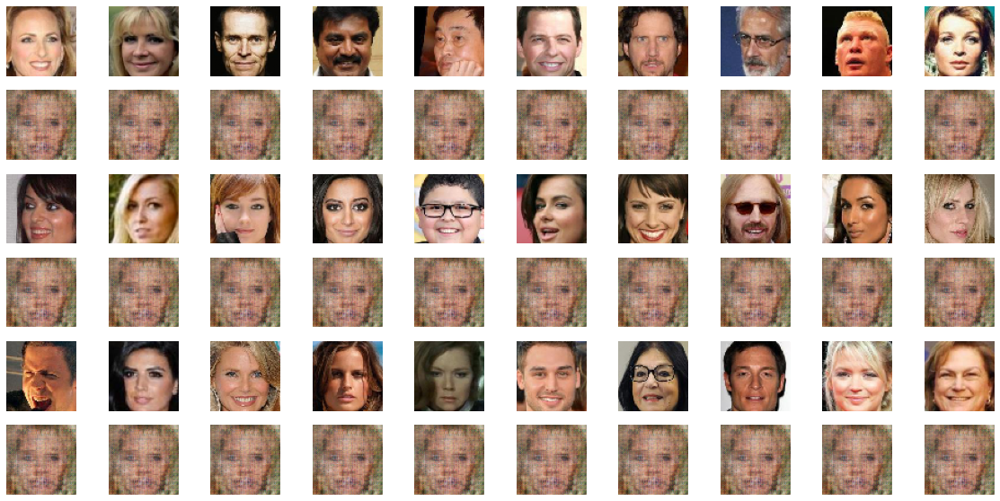

* Batch 33800 : rec_loss = 0.663923, gen_loss = 10.003550, disc_loss = 0.000127
* Batch 33900 : rec_loss = 0.694626, gen_loss = 8.587233, disc_loss = 0.000594
* Batch 34000 : rec_loss = 0.665768, gen_loss = 11.664782, disc_loss = 0.000046
* Batch 34100 : rec_loss = 0.678079, gen_loss = 5.166467, disc_loss = 0.037150
* Batch 34200 : rec_loss = 0.665655, gen_loss = 7.100485, disc_loss = 0.010763
* Batch 34300 : rec_loss = 0.683347, gen_loss = 8.271886, disc_loss = 0.001671
* Batch 34400 : rec_loss = 0.690267, gen_loss = 8.789861, disc_loss = 0.001692
* Batch 34500 : rec_loss = 0.665429, gen_loss = 8.230551, disc_loss = 0.000709
* Batch 34600 : rec_loss = 0.671235, gen_loss = 8.252766, disc_loss = 0.002118
* Batch 34700 : rec_loss = 0.669958, gen_loss = 10.225657, disc_loss = 0.000144
* Batch 34800 : rec_loss = 0.660772, gen_loss = 9.581530, disc_loss = 0.001597
* Batch 34900 : rec_loss = 0.680476, gen_loss = 9.944279, disc_loss = 0.001121
* Batch 35000 : rec_loss = 0.675982, gen_loss = 9

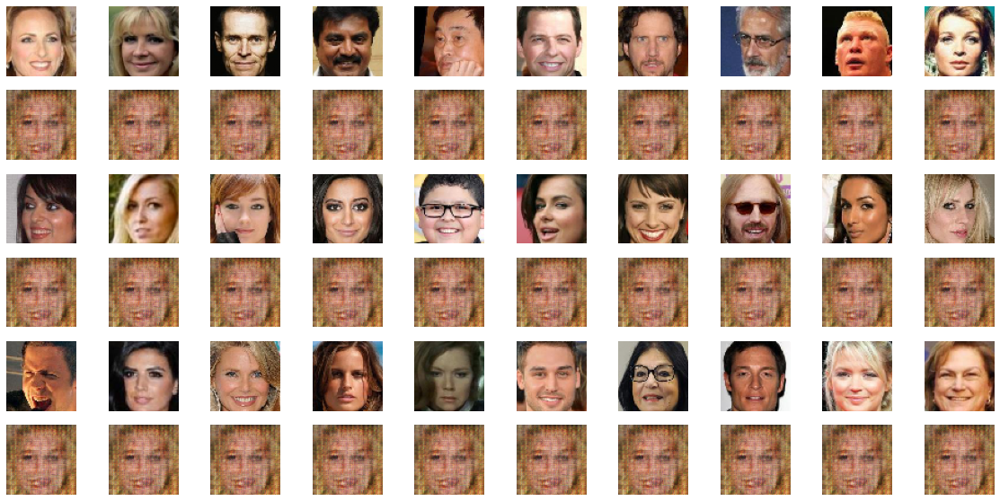

* Batch 36000 : rec_loss = 0.670066, gen_loss = 6.864185, disc_loss = 0.005470
* Batch 36100 : rec_loss = 0.664049, gen_loss = 9.258911, disc_loss = 0.000328
* Batch 36200 : rec_loss = 0.668364, gen_loss = 9.583879, disc_loss = 0.000581
* Batch 36300 : rec_loss = 0.665399, gen_loss = 10.145128, disc_loss = 0.001080
* Batch 36400 : rec_loss = 0.674198, gen_loss = 9.346458, disc_loss = 0.000882
* Batch 36500 : rec_loss = 0.676693, gen_loss = 11.445827, disc_loss = 0.000048
* Batch 36600 : rec_loss = 0.678739, gen_loss = 14.389818, disc_loss = 0.000003
* Batch 36700 : rec_loss = 0.657507, gen_loss = 9.426857, disc_loss = 0.000566
* Batch 36800 : rec_loss = 0.678789, gen_loss = 8.122728, disc_loss = 0.004854
* Batch 36900 : rec_loss = 0.670600, gen_loss = 8.154132, disc_loss = 0.002525
* Batch 37000 : rec_loss = 0.674668, gen_loss = 10.997359, disc_loss = 0.000162
* Batch 37100 : rec_loss = 0.667915, gen_loss = 10.431456, disc_loss = 0.000281
* Batch 37200 : rec_loss = 0.679617, gen_loss =

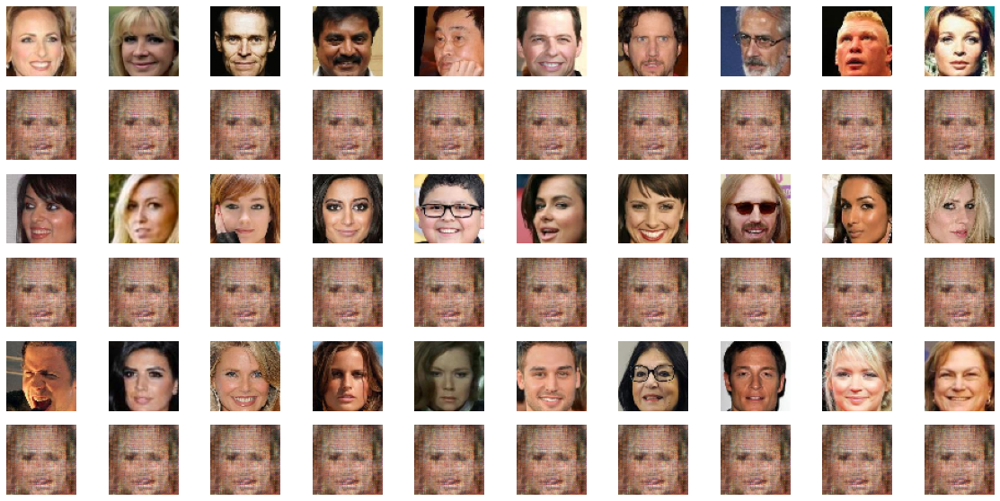

* Batch 38300 : rec_loss = 0.694557, gen_loss = 8.121737, disc_loss = 0.002803
* Batch 38400 : rec_loss = 0.661487, gen_loss = 8.130120, disc_loss = 0.003087
* Batch 38500 : rec_loss = 0.686807, gen_loss = 10.996908, disc_loss = 0.000125
* Batch 38600 : rec_loss = 0.682668, gen_loss = 10.783630, disc_loss = 0.000555
* Batch 38700 : rec_loss = 0.670774, gen_loss = 14.436857, disc_loss = 0.000003
* Batch 38800 : rec_loss = 0.677476, gen_loss = 10.810524, disc_loss = 0.000096
* Batch 38900 : rec_loss = 0.662970, gen_loss = 10.431963, disc_loss = 0.000079


KeyboardInterrupt: 

In [73]:
train(train_ds, 100)  

In [51]:
def plot_recimg(model):
    org_img = x_train[:100]
    rec_img = model(x_train[:100], training=False)
    fig, ax = plt.subplots(6, 10, figsize=(20, 10))
    for i in range(10):
        for j in range(6):
            if j%2 ==0: img=org_img 
            else: img=rec_img
            ax[j][i].set_axis_off()
            ax[j][i].imshow(img[10*(j//2)+i])
    
    #plt.savefig('%s/recimg_%i.png'%(save_dir,epoch))
    plt.show()
    plt.close('all')